In [1]:
import cv2
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd 

In [2]:
def printImgs(images,lsNames,lsValPSNR, n=1, m=1, title='',k=0):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(15, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )
    i=0
    for ax, image,lsName,lsval in zip(axs.flat, images,lsNames,lsValPSNR):
        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        ax.set_title(lsName)
        if i>k:
            ax.set_xlabel(str("{:.3f}".format(lsval)),fontsize=14)
        i=i+1    
    plt.savefig(title)    
    plt.show()
    
def printAng(images,lsNames,lsValPSNR, n=1, m=1, title=''):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(15, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )

    for ax, image,lsName,lsval in zip(axs.flat, images,lsNames,lsValPSNR):
        ax.imshow(image)
        ax.set_title(lsName)
        ax.set_xlabel(str("{:.3f}".format(lsval)),fontsize=14)   
    plt.savefig(title)    
    plt.show()


def printGrafs(images, n=1, m=1, title=''):
    
    images = images[:n*m]
    fig, axs = plt.subplots(
        nrows=n, ncols=m, 
        figsize=(18, 20), 
        subplot_kw={
            'xticks': [], 
            'yticks': []
        }
    )
    for ax, image in zip(axs.flat, images):
        ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.savefig(title)    
    plt.show()

In [3]:
### DIP - VTV - GradRimm - Dirac
lsNumPrue = ['400B','390','400C','392B']
lambAsLS = ['0','0.01','0.003','0.01']
typeP = 'den25'

kodim_num_i = 17

In [4]:
lsBestImg = []
    
ruta = './IMGkodim'+ str(kodim_num_i) +'/'

#original
namefig = './denoising/kodim'+ str(kodim_num_i) + '.png'
imgOut = cv2.imread(namefig)
lsBestImg.append(imgOut)
filename = ruta + 'kodim'+ str(kodim_num_i) +'.png'
cv2.imwrite(filename, imgOut)

#denoisig25
namefig = './noisy_25/noisy_25_kodim'+ str(kodim_num_i) + '.png'
imgOut = cv2.imread(namefig)
lsBestImg.append(imgOut)
filename = ruta + 'noisy_25_kodim'+ str(kodim_num_i) + '.png'
cv2.imwrite(filename, imgOut)

for Nprueb,lambAs in zip(lsNumPrue,lambAsLS):
    ls = []
    ruta = './'+ Nprueb +'/BestPnsr'+ typeP + '_P'+ Nprueb +'lamb'+ lambAs +'/'
    namefig = ruta + 'BestPnsr'+ typeP +'_P'+ Nprueb +'_'+ lambAs + 'kodim'+ str(kodim_num_i) +'.png'
    imgOut = cv2.imread(namefig)
    lsBestImg.append(imgOut)
    
    filename = ruta + 'BestIMGP'+ Nprueb +'_'+ lambAs + 'kodim'+ str(kodim_num_i) +'.png'
    cv2.imwrite(filename, imgOut)

In [5]:
lsNames = ['Original','Noisy','DIP', 'DIP-VTV',' DIP-RiemannVTV', 'DIP-DiracVTV$^{NL}$']

In [6]:
#lsValPSNR = [' ','20.321','28,247','29,111','29,306','29,400']

from skimage.metrics import peak_signal_noise_ratio as compare_psnr

lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

/home/linux21/miniconda3/lib/python3.10/site-packages/skimage/metrics/simple_metrics.py:163: RuntimeWarning: divide by zero encountered in double_scalars
  return 10 * np.log10((data_range ** 2) / err)


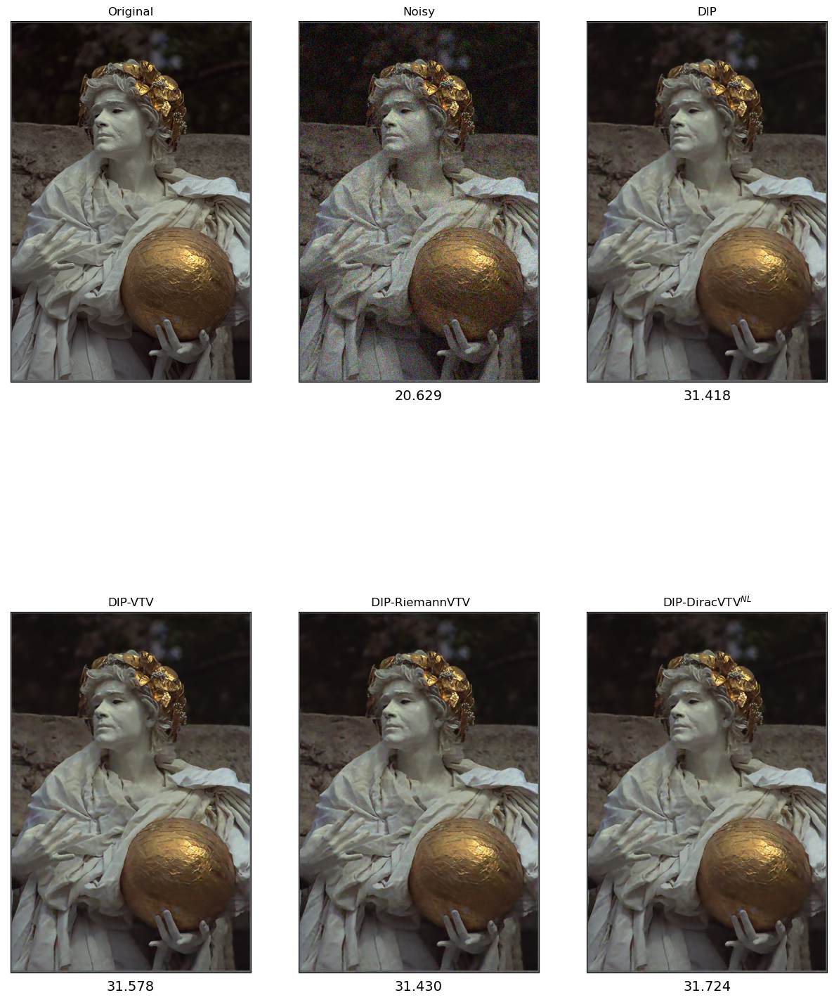

In [7]:
titulo = 'ComImg'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsBestImg,lsNames,lsValPSNR, 2, 3, titulo)

In [12]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

In [13]:
(a_y,a_x) = (280,100)
(b_y,b_x) = (380,200)
(c_y,c_x) = (350,380)
(d_y,d_x) = (450,470)

In [14]:
lsImgRec =[]
lscrtG =[]
lscrtR =[]
for i in range(len(lsBestImg)):
    imgRec=lsBestImg[i].copy()
    rec1=cv2.rectangle(imgRec,(a_y,a_x),(b_y,b_x),(0,255,0),2)
    rec2=cv2.rectangle(imgRec,(c_y,c_x),(d_y,d_x),(0,0,255),2)
    lsImgRec.append(imgRec)
    
    cort1G = imgRec[a_x+1:b_x,a_y+1:b_y,:].copy()
    lscrtG.append(cort1G)
    cort1R = imgRec[c_x+1:d_x,c_y+1:d_y,:].copy()
    lscrtR.append(cort1R)

In [15]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.629174683920517, 31.418087097312647, 31.578227282920565, 31.429587105476525, 31.724431013974428]
31.724431013974428
5


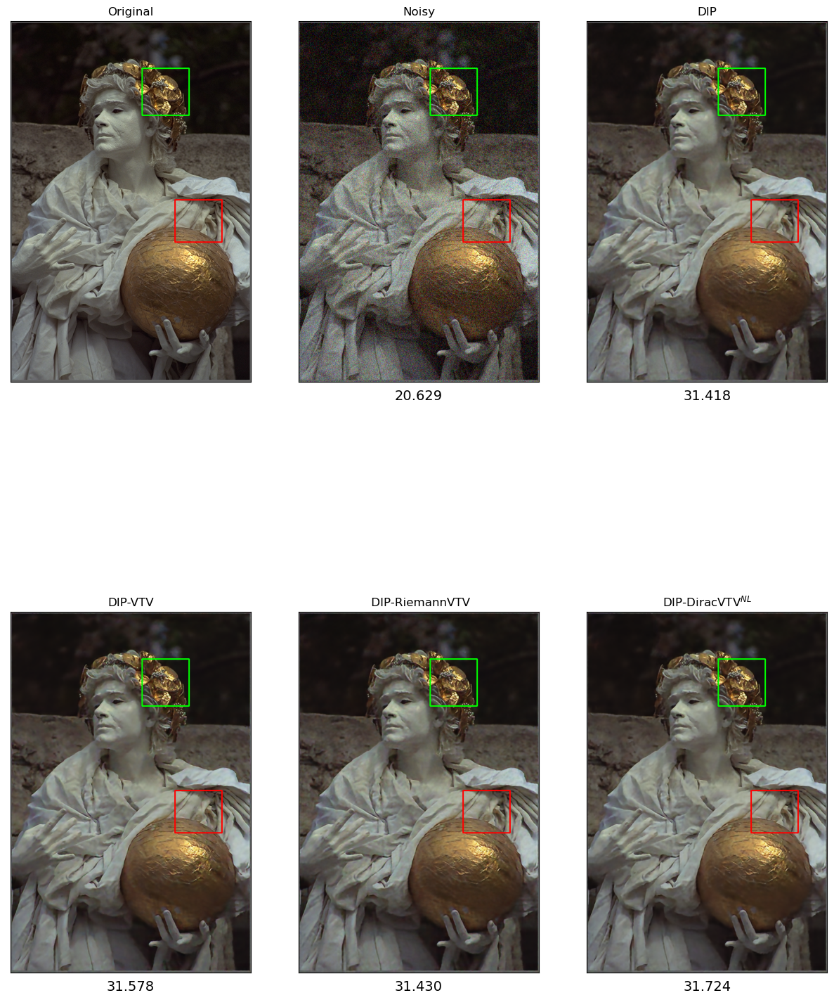

In [16]:
titulo = 'ComImgREC'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'
printImgs(lsImgRec,lsNames,lsValPSNR, 2, 3, titulo)

In [17]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lscrtG[0],lscrtG[i])
    lsValPSNR.append(val)
    

In [18]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[21.060599630464537, 25.960970192645615, 26.2277915752609, 26.14365130986176, 26.23472921264542]
26.23472921264542
5


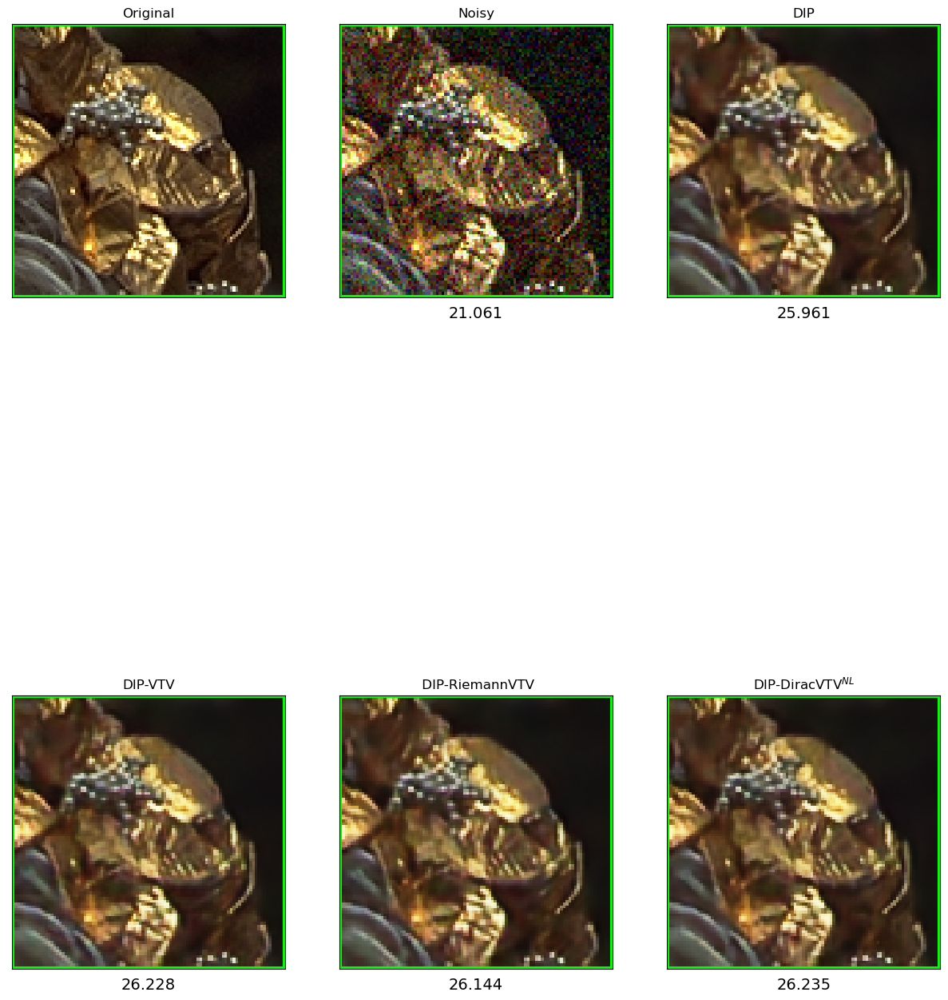

In [19]:
titulo = 'ComImgRectG'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lscrtG,lsNames,lsValPSNR, 2, 3, titulo)

In [20]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lscrtR[0],lscrtR[i])
    lsValPSNR.append(val)

In [21]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.374624071795363, 29.820710983315145, 30.078458842691823, 29.646504536703052, 30.24344588594856]
30.24344588594856
5


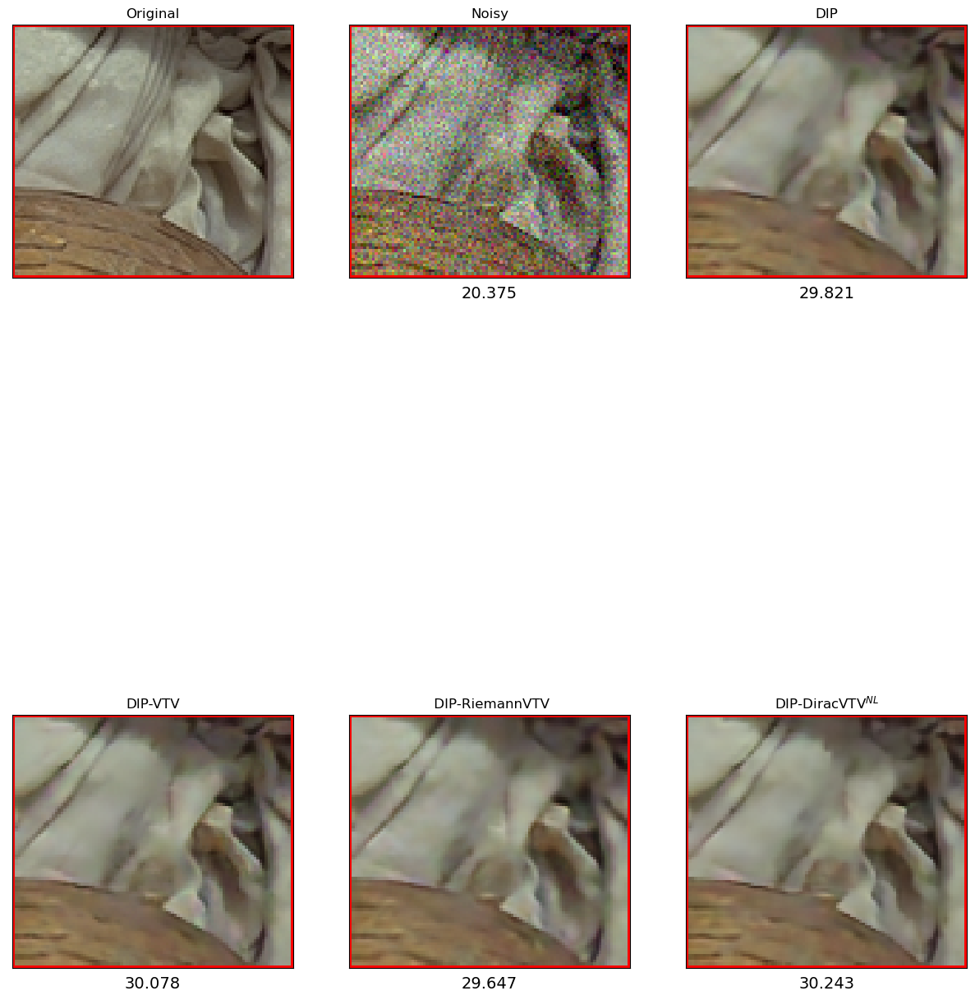

In [22]:
titulo = 'ComImgRectR'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lscrtR,lsNames,lsValPSNR, 2, 3, titulo)

In [23]:
def printVect(i,j,lsBestImg):
    lsImgVec = []

    color = [(255,0,0),(0,255,0),(0,0,255)]
    fact=70

    for imgParche in lsBestImg:

        imgObj = imgParche.copy()
        derX = imgObj[:,:-1,:] - imgObj[:,1:,:]
        derY = imgObj[:-1,:,:] - imgObj[1:,:,:]

        for k in range(3):
            capa = k

            (v1,v2) = (derX[i,j,capa],derY[i,j,capa])
            norm = np.sqrt(v1**2+v2**2)
            (v1u,v2u) = (fact*v1//norm,fact*v2//norm)
            imgOut = cv2.arrowedLine(imgObj, (j,i), (int(j+v2u),int(i+v1u)), color[k], 4,  cv2.LINE_AA)#, 0, 0.5)#cv2.LINE_4)#
            print((i, j), (int(i+v1u), int(j+v2u)))

        lsImgVec.append(imgObj)
    return lsImgVec

In [24]:
#INtento 1
def calcularAng1(imgIN):
    lsImgVec = []

    color = [(255,0,0),(0,255,0),(0,0,255)]
    pares=[[0,1]]#,[0,2],[1,2]]
    
    
    imgObj = imgIN.copy()
    derX = imgObj[:,:-1,:].astype(int) - imgObj[:,1:,:].astype(int)
    derY = imgObj[:-1,:,:].astype(int) - imgObj[1:,:,:].astype(int)
    n,m,C = np.shape(derX)
    n-=1
    print('shape',n,m,C)
    
    ##Igualar tamaños
    derX=derX[:-1,:,:]
    derY=derY[:,:-1,:]
    
    normT = np.sqrt(derX**2 + derY**2)
    
    prodBG = derX[:,:,0]*derX[:,:,1] + derY[:,:,0]*derY[:,:,1]
    prodBR = derX[:,:,0]*derX[:,:,2] + derY[:,:,0]*derY[:,:,2]
    prodGR = derX[:,:,1]*derX[:,:,2] + derY[:,:,1]*derY[:,:,2]
    
    normBG = normT
    normBR =
    normGR = 
    
    lsProd = [prodBG,prodBR,prodGR]
    cout=0
    
    imgANG= np.zeros((n,m))
    true=0
    for i in range(10):
        for j in range(10):
            
            lsAng=[]
            promPX=0
            
            #Angulos de cada canal
            for k in range(C):
                matProd=lsProd[k]
                prod = matProd[i][j]
                
                norm = normV*normU
                print('norm=',norm)
                
                if prod ==prodBG[i][j]:
                    print('true')
                    true+=1
                
                if(prod<0):
                    cout+=1
                if(norm!=0):
                    arg=prod/norm
                    print('arg',arg)
                    print('dif',abs(prod)-1)
                    if(abs(arg)-1<1e-8):
                        ang=0
                    else:
                        ang=math.acos(arg)

                    print('ang',ang)
                else:
                    ang=0
                    
                promPX+=ang
            
            promPX=np.mean(promPX)

            print('promPX',promPX)
            
            imgANG[i][j]=promPX
        
        lsImgVec.append(imgObj)
    
    print('contador',cout)
    print('true',true)
    
    return imgANG

SyntaxError: invalid syntax (2924944913.py, line 27)

In [25]:
np.shape(lscrtG[0])

(99, 99, 3)

In [26]:
imgIN = lscrtG[0]

In [27]:
def calcularAng(imgIN):

    color = [(255,0,0),(0,255,0),(0,0,255)]
    pares=[[0,1]]#,[0,2],[1,2]]
    
    
    imgObj = imgIN.copy()
    derX = imgObj[:,:-1,:].astype(int) - imgObj[:,1:,:].astype(int)
    derY = imgObj[:-1,:,:].astype(int) - imgObj[1:,:,:].astype(int)
    n,m,C = np.shape(derX)
    n-=1
    print('shape',n,m,C)
    
    ##Igualar tamaños
    derX=derX[:-1,:,:]
    derY=derY[:,:-1,:]
    
    normT = np.sqrt(derX**2 + derY**2)
    
    prodBG = derX[:,:,0]*derX[:,:,1] + derY[:,:,0]*derY[:,:,1]
    prodBR = derX[:,:,0]*derX[:,:,2] + derY[:,:,0]*derY[:,:,2]
    prodGR = derX[:,:,1]*derX[:,:,2] + derY[:,:,1]*derY[:,:,2]
    
    normBG = normT[:,:,0]*normT[:,:,1]
    normBR = normT[:,:,0]*normT[:,:,2]
    normGR = normT[:,:,1]*normT[:,:,2]
    
    lsProd = [prodBG,prodBR,prodGR]
    lsNorm = [normBG,normBR,normGR]
    
    cout=0
    ban=0
    
    imgANG= np.zeros((n,m))
    true=0
    for i in range(n):
        for j in range(m):
            
            lsAng=[]
            promPX=0
            
            #Angulos de cada canal
            for k in range(C):
                matProd=lsProd[k]
                prod = matProd[i][j]
                matNorm = lsNorm[k]
                norm = matNorm[i][j]
                #print('norm=',norm)
                
                
                
                if(norm!=0):
                    arg = prod/norm
                    
                    if(abs(arg)>=1):
                        ang=0
                        #print('ang0',ang)
                    else:
                        ang=math.acos(arg)
                        if(ban==1):
                            #print('arg',arg)
                            #print('angAcos',ang)
                            ban=0
                    if(prod<0):#Angulo obtuso
                        cout+=1
                        #print('prod ij',prod,i,j)
                        ban=1
                        ang=np.pi-ang
                    #print('ang',ang)
                else:
                    ang=0
                    
                promPX+=ang
            
            promPX=np.mean(promPX)

            #print('promPX',promPX)
            
            imgANG[i][j]=promPX
        
        
    
    print('contador',cout)
    print('true',true)
    
    return imgANG

In [28]:
imgANG = calcularAng(lscrtG[0])

shape 98 98 3
contador 1369
true 0


In [29]:
imgANG
    
    

array([[0.00000000e+00, 6.28318531e+00, 6.28318531e+00, ...,
        6.28318531e+00, 6.28318531e+00, 6.28318531e+00],
       [6.28318531e+00, 6.37111354e-01, 1.23248006e-01, ...,
        2.85779854e+00, 0.00000000e+00, 5.57194202e-01],
       [6.28318531e+00, 7.81214087e-01, 3.94791120e-01, ...,
        2.10734243e-08, 4.37337892e-01, 5.89929565e-01],
       ...,
       [6.28318531e+00, 2.06163217e-01, 9.27295218e-01, ...,
        2.49809154e+00, 1.53543783e-01, 2.57443558e-01],
       [6.28318531e+00, 0.00000000e+00, 2.06163217e-01, ...,
        0.00000000e+00, 3.59707014e-01, 4.72422012e-01],
       [6.28318531e+00, 6.28318531e+00, 2.94657563e-01, ...,
        6.28318531e+00, 3.84239165e-01, 6.28318531e+00]])

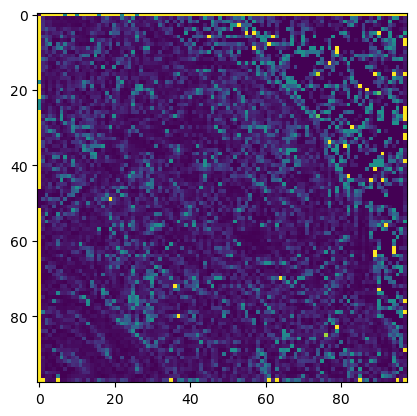

In [30]:
plt.imshow(imgANG)

In [31]:
np.mean(imgANG)

0.7785937194402021

shape 767 511 3
contador 33365
true 0
shape 767 511 3
contador 545190
true 0
shape 767 511 3
contador 81401
true 0
shape 767 511 3
contador 75871
true 0
shape 767 511 3
contador 69918
true 0
shape 767 511 3
contador 24362
true 0


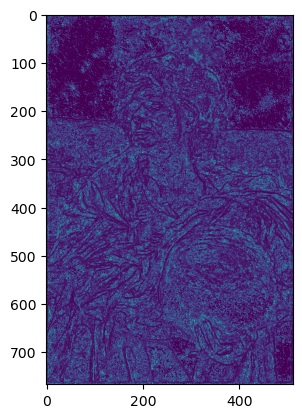

In [32]:
lsImgAng=[]
lsAngProm=[]

for img in lsBestImg:#lscrtG:
    imgOut = calcularAng(img)
    lsImgAng.append(imgOut)
    prom=np.mean(imgOut)
    lsAngProm.append(prom)
    plt.imshow(imgOut)

In [33]:
lsAngProm

[0.7480935524119133,
 2.1836263887977987,
 1.2519172824631692,
 1.1880127719917006,
 1.172239320864136,
 0.8253864077180981]

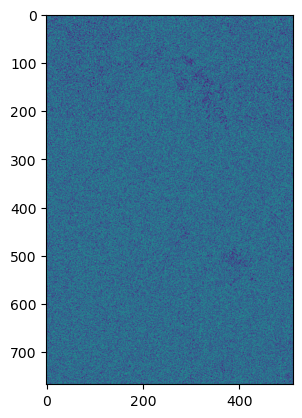

In [34]:
plt.imshow(lsImgAng[1])

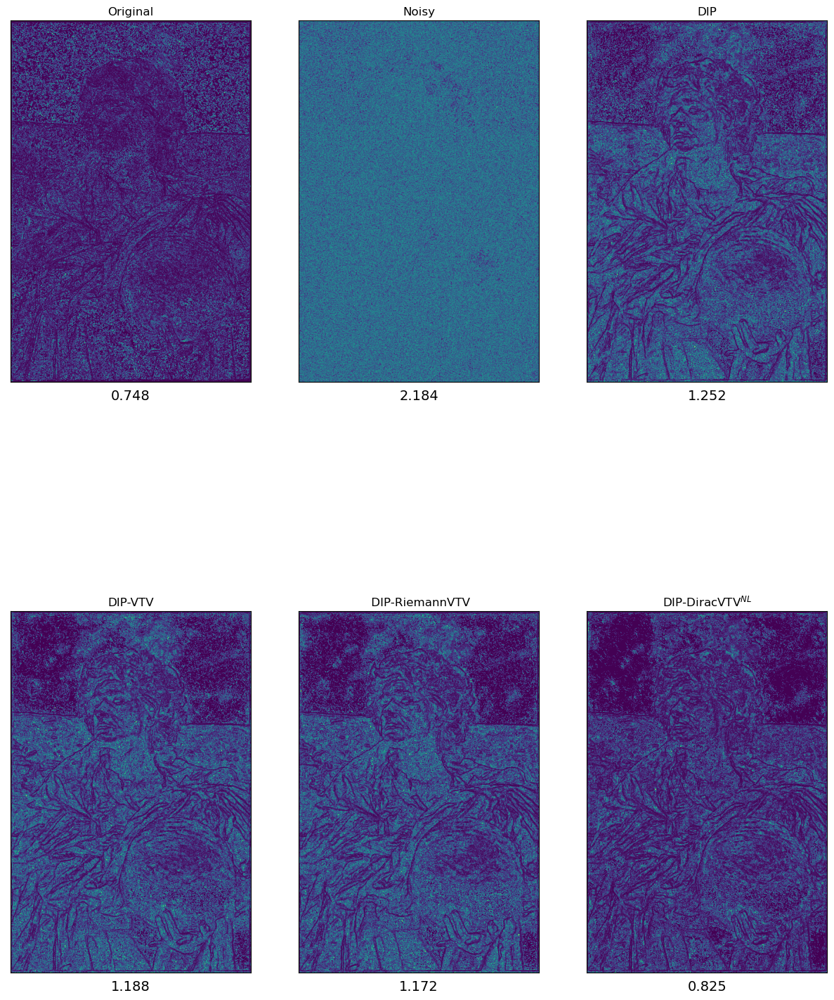

In [35]:
titulo = 'ImgAng'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printAng(lsImgAng,lsNames,lsAngProm, 2, 3, titulo)

In [36]:
lsImgVec = printVect(550,430,lsBestImg)
#lsImgVec = printVect(234,191,lsImgVec)

(550, 430) (550, 500)
(550, 430) (550, 499)
(550, 430) (550, 499)
(550, 430) (600, 478)
(550, 430) (580, 493)
(550, 430) (597, 481)
(550, 430) (599, 479)
(550, 430) (550, 499)
(550, 430) (550, 500)
(550, 430) (619, 430)
(550, 430) (620, 430)
(550, 430) (619, 430)
(550, 430) (612, 461)
(550, 430) (612, 461)
(550, 430) (620, 430)
(550, 430) (619, 430)
(550, 430) (619, 430)
(550, 430) (620, 430)


In [37]:
lsImgVec = lsBestImg.copy()

In [38]:
import random
DICT = [(550,430),(355, 164),(152, 341)]#(352, 485), (144, 296) #kodim 17
#DICT = [(163,120),(196, 62),(231, 196), (291, 156)] #Kodim19

ls = []
for i in range(6):
    x = random.randint(0, 768)
    y = random.randint(0, 512)
    ls.append((x,y))
print(ls)
for (x,y) in DICT:
    lsImgVec = printVect(x,y,lsImgVec)

[(62, 8), (542, 306), (140, 374), (149, 37), (544, 231), (429, 505)]
(550, 430) (550, 500)
(550, 430) (550, 499)
(550, 430) (550, 499)
(550, 430) (600, 478)
(550, 430) (580, 493)
(550, 430) (597, 481)
(550, 430) (599, 479)
(550, 430) (550, 499)
(550, 430) (550, 500)
(550, 430) (619, 430)
(550, 430) (620, 430)
(550, 430) (619, 430)
(550, 430) (612, 461)
(550, 430) (612, 461)
(550, 430) (620, 430)
(550, 430) (619, 430)
(550, 430) (619, 430)
(550, 430) (620, 430)
(355, 164) (355, 234)
(355, 164) (355, 233)
(355, 164) (355, 233)
(355, 164) (382, 228)
(355, 164) (413, 202)
(355, 164) (403, 214)
(355, 164) (404, 213)
(355, 164) (404, 213)
(355, 164) (404, 213)
(355, 164) (404, 213)
(355, 164) (404, 213)
(355, 164) (355, 234)
(355, 164) (425, 164)
(355, 164) (404, 213)
(355, 164) (404, 213)
(355, 164) (404, 213)
(355, 164) (404, 213)
(355, 164) (404, 213)
(152, 341) (211, 377)
(152, 341) (214, 373)
(152, 341) (214, 372)
(152, 341) (194, 397)
(152, 341) (174, 407)
(152, 341) (156, 410)
(152, 3

In [39]:
lsValPSNR = []

for i in range(6):
    val = compare_psnr(lsBestImg[0],lsBestImg[i])
    lsValPSNR.append(val)

In [40]:
print(lsValPSNR[1:])
print(max(lsValPSNR[1:]))
print(np.argmax(lsValPSNR[1:])+1)

[20.629174683920517, 31.418087097312647, 31.578227282920565, 31.429587105476525, 31.724431013974428]
31.724431013974428
5


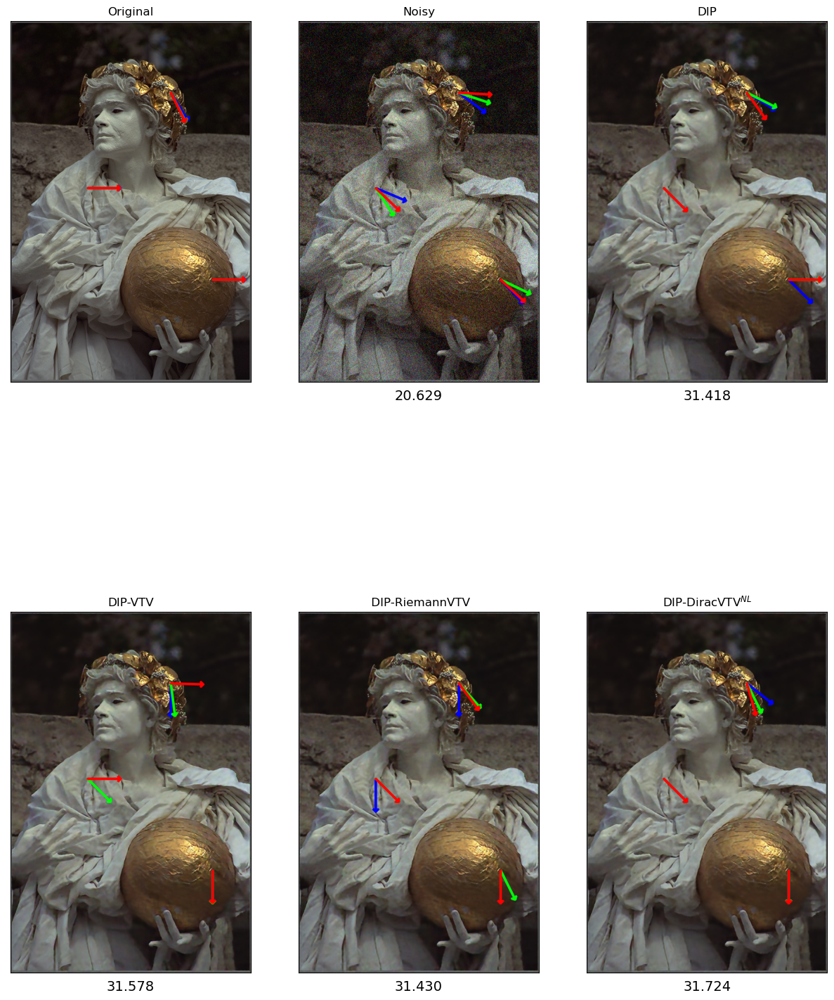

In [41]:
titulo = 'ComImgVect'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

#printImgs(lsImgVec[2:],lsNames[2:],lsValPSNR[2:], 1, 4, titulo)
printImgs(lsImgVec,lsNames,lsValPSNR, 2, 3, titulo)

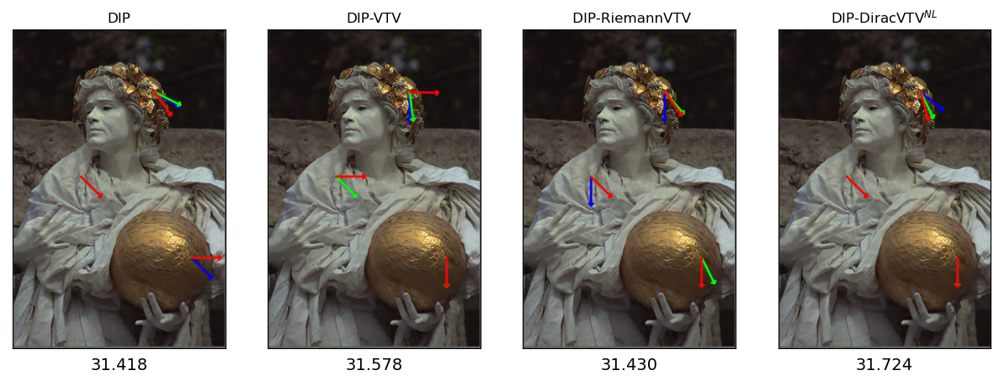

In [42]:
titulo = 'ComImgVectRedu'+typeP +'KODIMnum' + str(kodim_num_i) + '.png'

printImgs(lsImgVec[2:],lsNames[2:],lsValPSNR[2:], 1, 4, titulo,-1)

In [43]:
[(152, 341), (144, 296), (239, 433), (214, 203), (270, 60), ]

[(152, 341), (144, 296), (239, 433), (214, 203), (270, 60)]

In [44]:
imgDIP = lsBestImg[2].copy()

In [45]:
imgDIP.shape

(768, 512, 3)

In [46]:
derX = imgDIP[:,:-1,:] - imgDIP[:,1:,:]
derY = imgDIP[:-1,:,:] - imgDIP[1:,:,:]

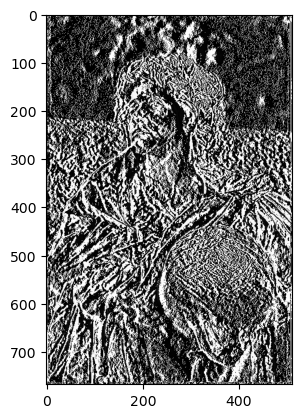

In [47]:
plt.imshow(derX[:,:,0], 'gray')

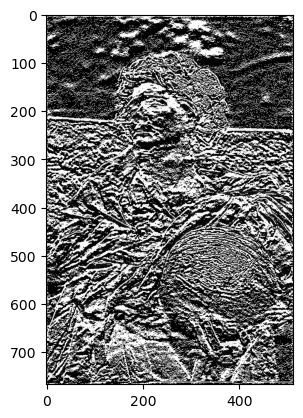

In [48]:
plt.imshow(derY[:,:,0], 'gray')

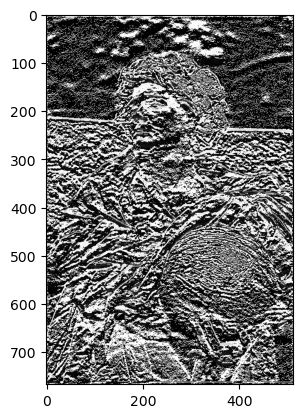

In [49]:
plt.imshow(derY[:,:,0]+derY[:,:,0], 'gray')

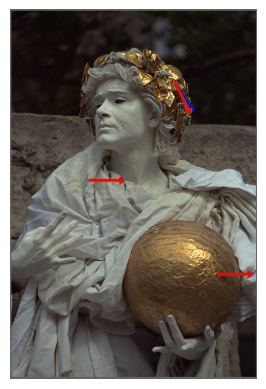

In [50]:
namefig = 'GradidentesImagenOrg'+  str(kodim_num_i) + '.png'
plt.imshow(cv2.cvtColor(lsImgVec[0], cv2.COLOR_BGR2RGB))
plt.axis('off')
plt.savefig(namefig)